In [ ]:
!pip install kneed
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
from termcolor import colored

# for solve problem of show plotly plots
# from plotly.offline import init_notebook_mode
# init_notebook_mode(connected=True)

# Optional
# for filter warnings
import warnings
warnings.filterwarnings('ignore')

# Import requirement libraries and tools for modeling
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, estimate_bandwidth, AffinityPropagation, Birch, DBSCAN, OPTICS, AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
import scipy.cluster.hierarchy as sch
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn import set_config
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from itertools import product
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from kneed import KneeLocator

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


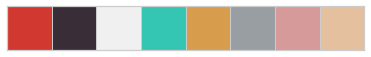

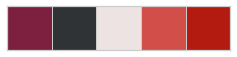

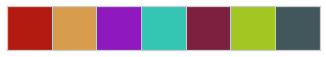

In [ ]:
def custom_palette(custom_colors):
    """Show color palette that use in this notebook"""
    customPalette = sns.set_palette(sns.color_palette(custom_colors))
    sns.palplot(sns.color_palette(custom_colors),size=0.8)
    plt.tick_params(axis='both', labelsize=0, length = 0)

 # for plot title
FONT = {'fontsize':30, 'fontstyle':'normal', 'fontfamily':'Georgia', 'backgroundcolor':'#B41B10', 'color':'#E4C09E'}

# Create List of Color Palletes
colors1 = ["#D1382F", "#392E37", "#F1F0F0", "#34C5B3", "#D79C4C", "#999EA2", "#D59A99", "#E4C09E"]
colors2 = ["#7D1F3F","#303336","#ECE3E2","#D24E49","#B41B10"]
dark_colors = ["#B41B10", "#D79C4C", "#8e18be", "#34C5B3", "#7D1F3F", "#a2c723", "#42575B"]
# Plot Color Palletes
for color in [colors1, colors2, dark_colors]:
    custom_palette(color)

In [ ]:
df = pd.read_csv("Customer_Data.csv")
df

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

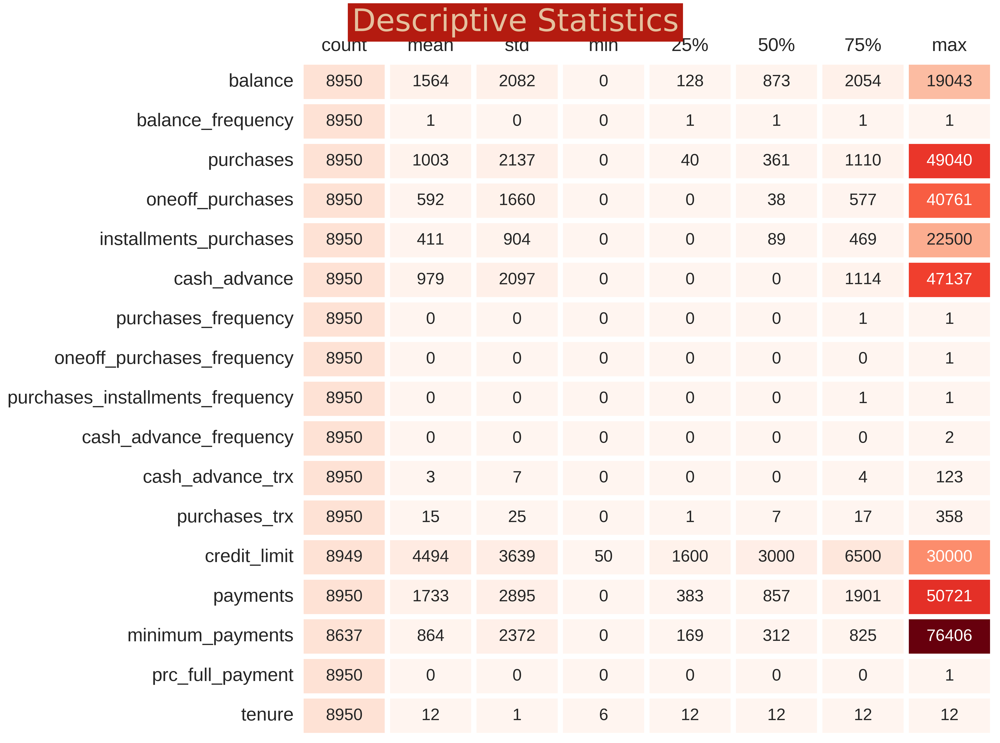

In [ ]:
desc_cust = df.select_dtypes(include=['int64','float64']).describe().T
desc_cust_df = pd.DataFrame(index=desc_cust.index, columns=desc_cust.columns, data=desc_cust )

f,ax = plt.subplots(figsize=(12,12),dpi=500)

sns.heatmap(desc_cust_df, annot=True,cmap = "Reds", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

ax.xaxis.set_ticks_position('top')
plt.tick_params(left=False, top=False)
plt.xticks(size = 18)
plt.yticks(size = 18)
plt.title("Descriptive Statistics", pad=30, x=0.31, y=1.02, fontdict=FONT)
plt.show()

In [ ]:
# Drop the cust_id columns because we do not neet it
df = df.drop('cust_id', axis=1)



In [ ]:
def highlight_cells(val):
    """Highlight cells that is not zero"""
    f_color = '#D1382F' if val != 0 else ''  # Red
    bg_color = '#D59A99' if val != 0 else ''   # Pink
    w_font = 'bold'
    return 'background-color: {}; color: {}; font-weight: {}'.format(bg_color, f_color, w_font)

# Check missing values
is_nan = df.isna().sum().to_frame(name='Number_of_NaN')
is_nan.insert(1,'Percent(%)', [round(x/df.shape[0]*100,2) for x in is_nan.Number_of_NaN])
is_nan.style.applymap(highlight_cells)

,Number_of_NaN,Percent(%)
balance,0,0.000000
balance_frequency,0,0.000000
purchases,0,0.000000
oneoff_purchases,0,0.000000
installments_purchases,0,0.000000
cash_advance,0,0.000000
purchases_frequency,0,0.000000
oneoff_purchases_frequency,0,0.000000
purchases_installments_frequency,0,0.000000
cash_advance_frequency,0,0.000000


In [ ]:
# Overview nan value in credit_limit column
df[df.credit_limit.isna()]

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [ ]:
# Drop row with nan value in credit_limit
df = df.drop(df[df.credit_limit.isna()].index, axis=0)

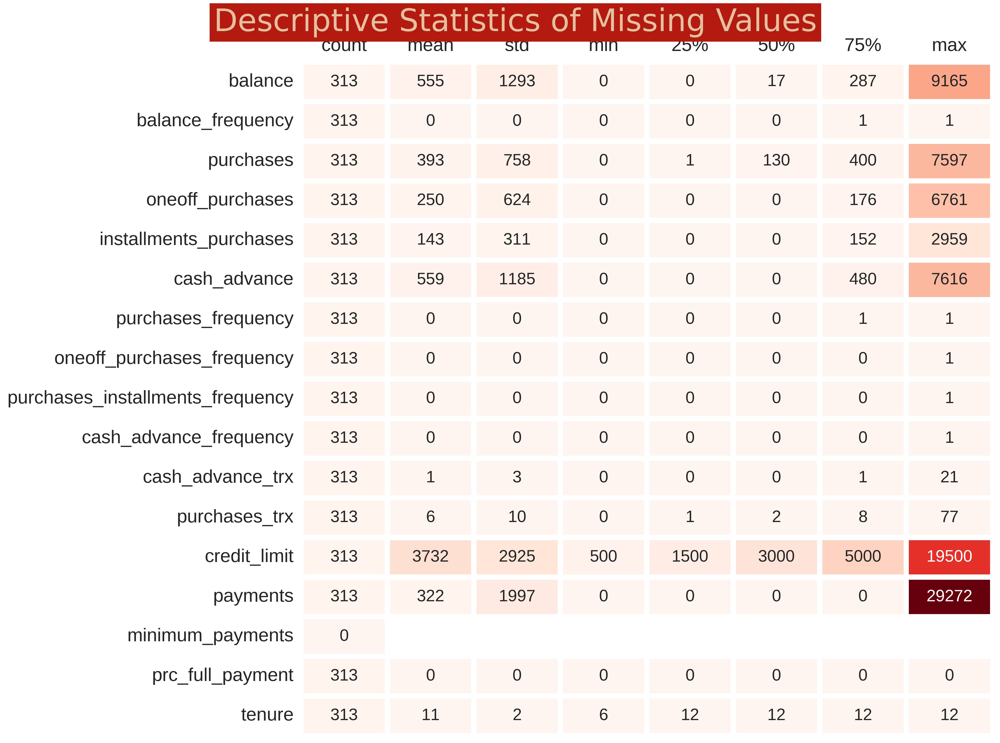

In [ ]:
desc_cust = df[df.minimum_payments.isna()].describe().T

desc_cust_df = pd.DataFrame(index=desc_cust.index, columns=desc_cust.columns, data=desc_cust )

f,ax = plt.subplots(figsize=(12,12),dpi=500)

sns.heatmap(desc_cust_df, annot=True,cmap = "Reds", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

ax.xaxis.set_ticks_position('top')
plt.tick_params(left=False, top=False)
plt.xticks(size = 18)
plt.yticks(size = 18)

plt.title("Descriptive Statistics of Missing Values", pad=30, x=0.31, y=1.02, fontdict=FONT)
plt.show()

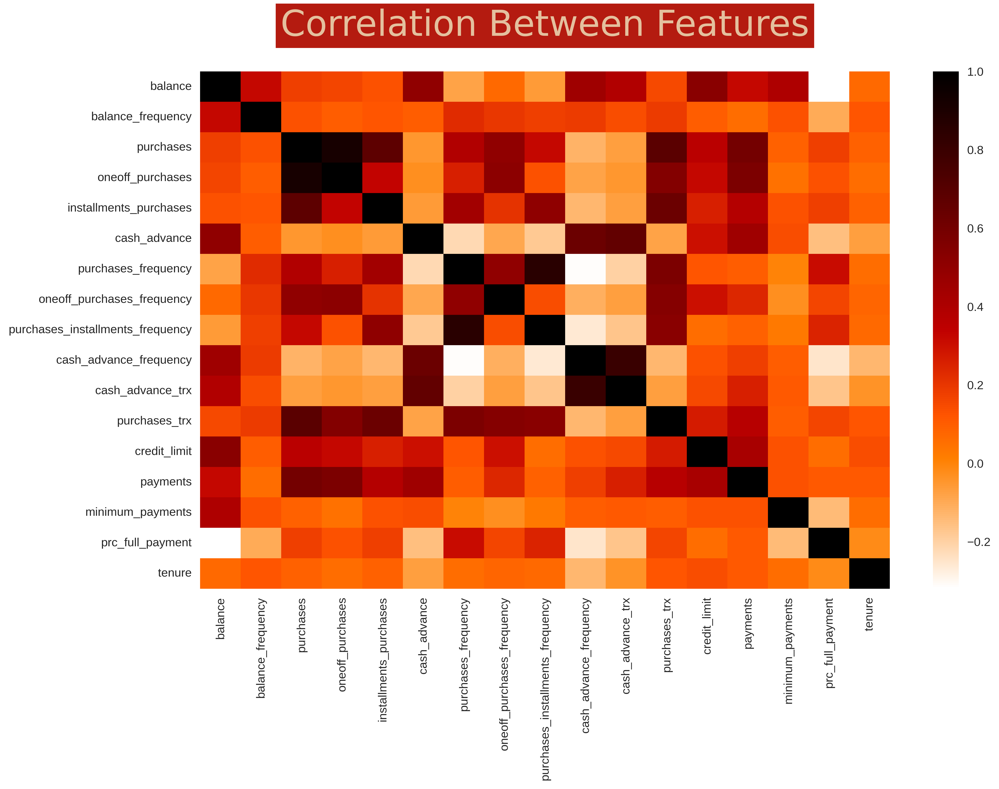

In [ ]:
# Overview correlation between features
plt.figure(figsize=(13,8), dpi=500)
sns.heatmap(round(df.corr(),2), annot=False, cmap='gist_heat_r')
plt.title("Correlation Between Features", pad=30, fontdict=FONT)
plt.show()



In [ ]:
# Fill the remaining missing values with KNNimputer()
# Define imputer
imputer = KNNImputer()
# Fit on the dataset
imputer.fit(df)
# Transform the dataset
df1 = pd.DataFrame(imputer.transform(df),columns=df.columns)

# Print result
print(colored(f'Missing (before): {df.isna().sum().sum()}', 'red'))
print(colored(f'Missing (after): {df1.isna().sum().sum()}', 'green'))

Missing (before): 313
Missing (after): 0


In [ ]:
# Check duplicated data
print(colored(f"Number of dupilcated data: {df1.duplicated().sum()}", 'red'), )

Number of dupilcated data: 0


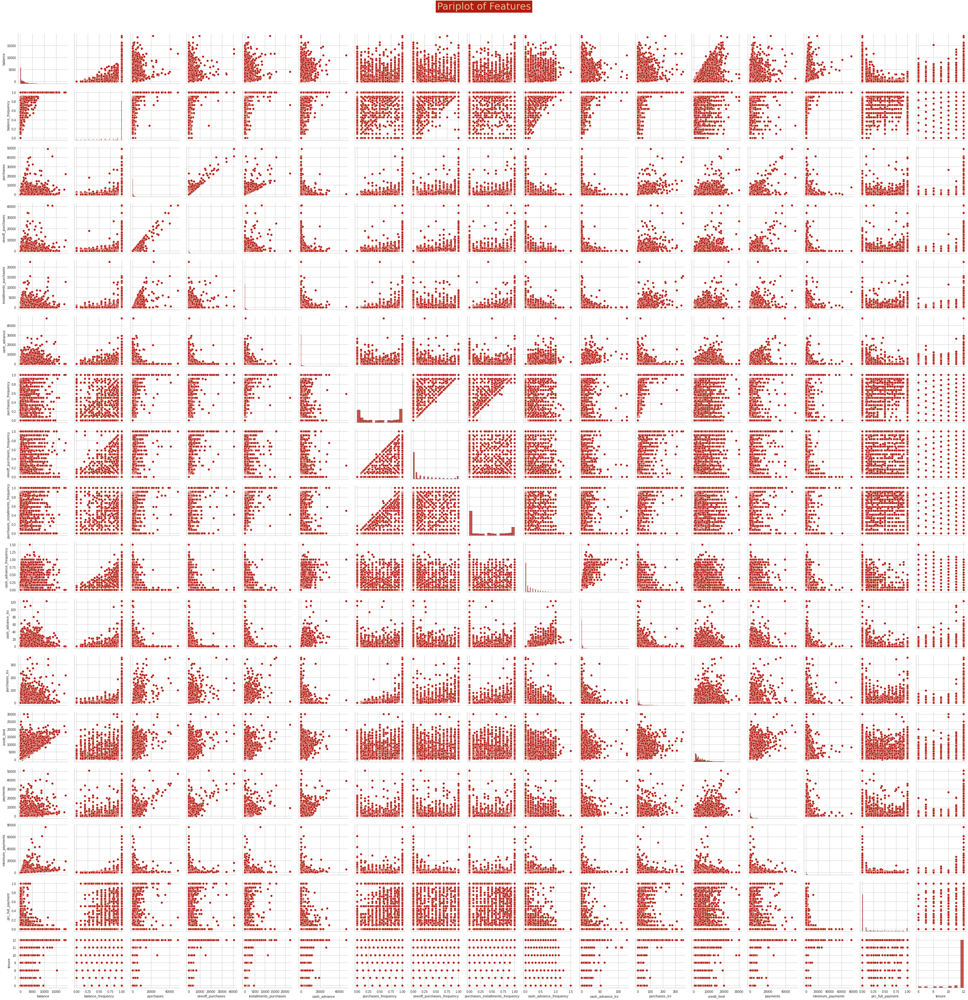

In [ ]:
# Draw pair plot for check noise and
pplot = sns.pairplot(df1, palette="#B41B10")
pplot.fig.suptitle("Pariplot of Features", y=1.02, **FONT)
pplot.tight_layout()
plt.show()

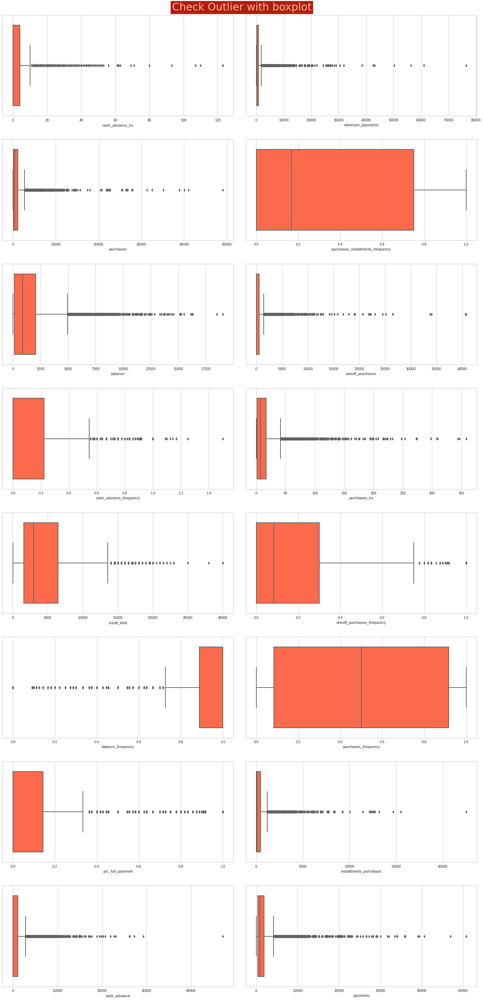

In [ ]:
# Draw boxplot for check outliers
fig ,ax = plt.subplots(8,2,figsize=(20,40))
for i, col in enumerate(set(df1.columns)-set(['tenure'])):
    sns.boxplot(data=df1, x=col, palette="Reds_r", saturation=1, linewidth = 2, ax=ax[i//2, i%2])
plt.suptitle("Check Outlier with boxplot", y=1, **FONT)
plt.tight_layout(pad=3.0)
plt.show()

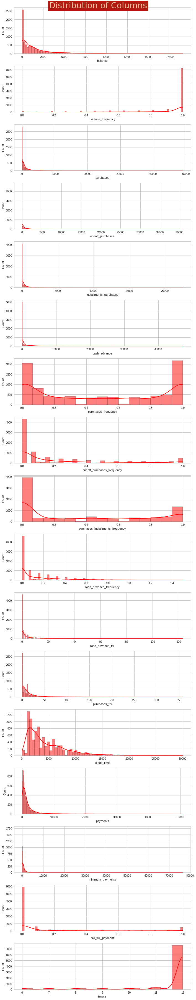

In [ ]:
# Check distribution of features
fig, ax = plt.subplots(17, 1, figsize=(10,50))
for i, col in enumerate(df1):
    sns.histplot(df1[col], kde=True, ax=ax[i], color='red')

fig.suptitle('Distribution of Columns',y=1.002, **FONT)
fig.tight_layout()
plt.show()

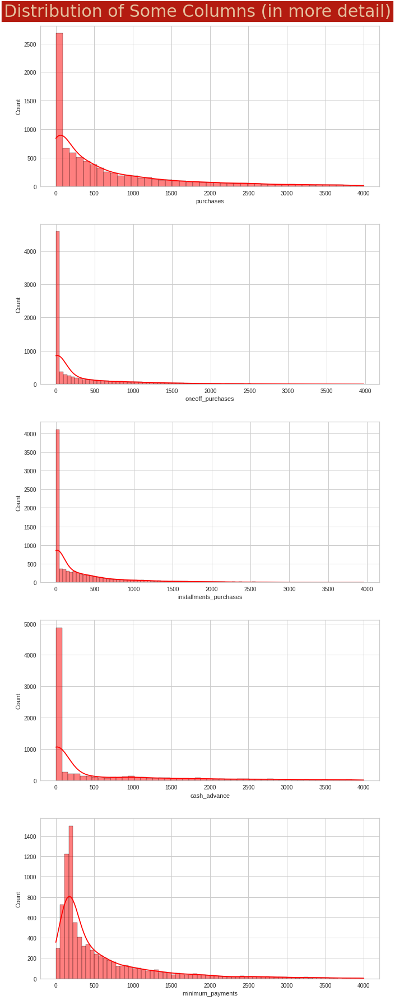

In [ ]:
# Check distribution of some features in more detail
cols = ['purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance', 'minimum_payments']
fig, ax = plt.subplots(5, 1, figsize=(10,25))
for i, col in enumerate(cols):
    sns.histplot(df1[df1 < 4000][col], kde=True, ax=ax[i], color='red')

fig.suptitle('Distribution of Some Columns (in more detail)',y=1.002, **FONT)
fig.tight_layout(pad=3)
plt.show()

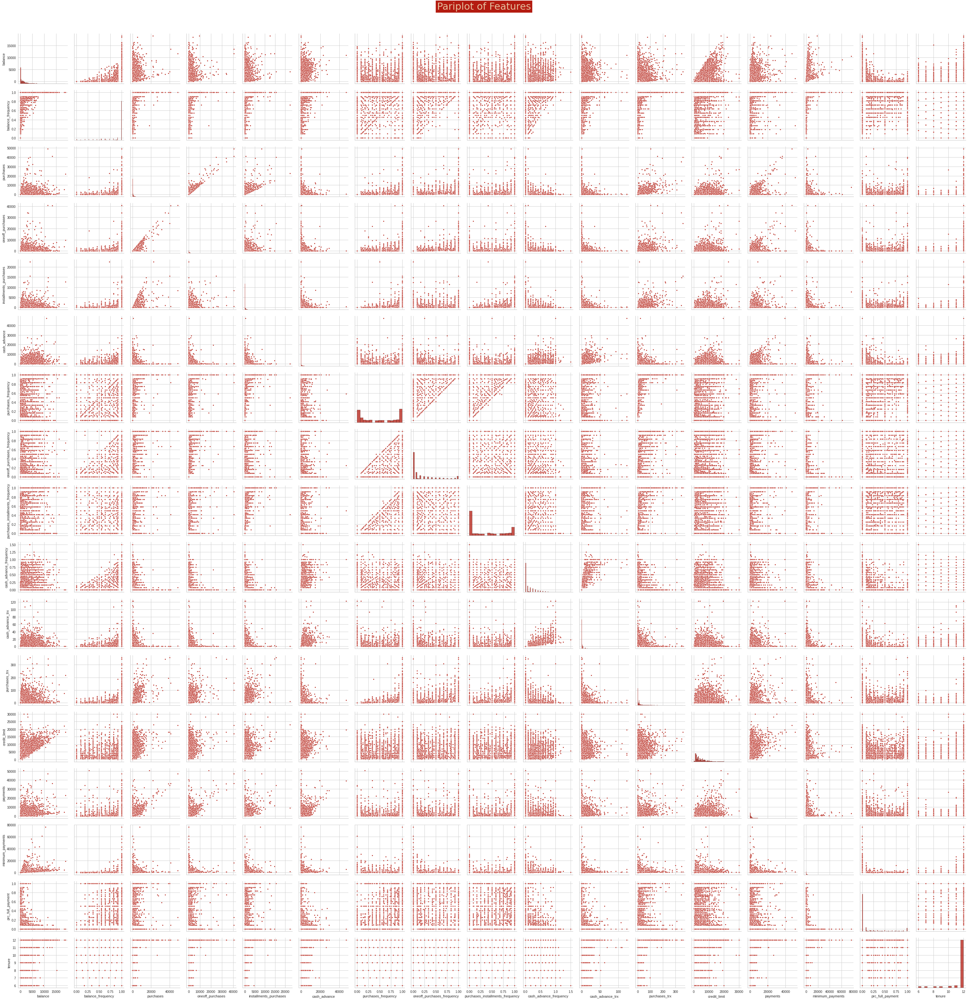

In [ ]:
# Draw pair plot for EDA
pplot = sns.pairplot(df1, palette="#B41B10", markers='.')
pplot.fig.suptitle("Pariplot of Features", y=1.02, **FONT)
pplot.tight_layout()
plt.show()

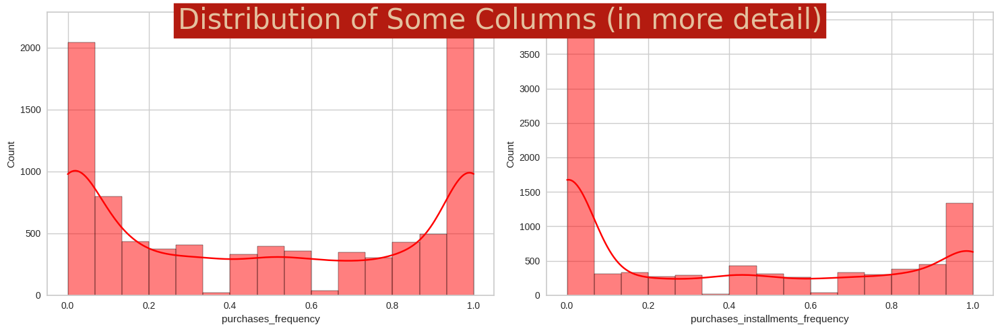

In [ ]:
# Check distribution of purchases_frequency and purchases_installment_frequency in more detail
fig, ax = plt.subplots(1,2,figsize=(15,5), dpi=100)
for i,col in enumerate(['purchases_frequency', 'purchases_installments_frequency']):
    sns.histplot(df1[col], kde=True, color='red', ax=ax[i])

fig.suptitle('Distribution of Some Columns (in more detail)', **FONT)
fig.tight_layout()
plt.show()

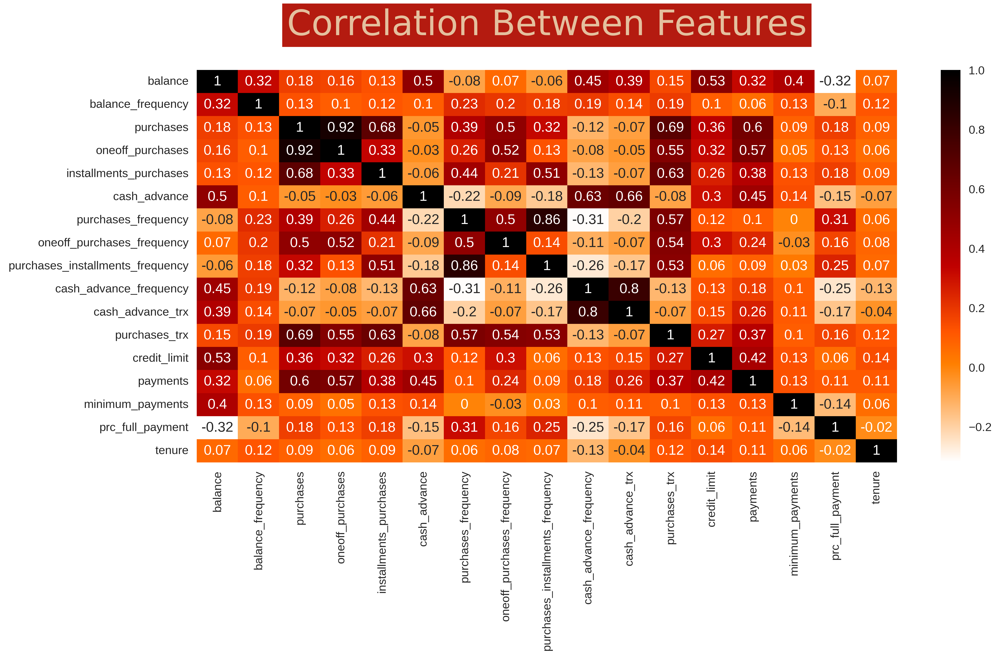

In [ ]:
# Correlation between features
plt.figure(figsize=(13,8), dpi=500)
sns.heatmap(round(df.corr(),2), annot=True, cmap='gist_heat_r')
plt.title("Correlation Between Features", pad=30, fontdict=FONT)
plt.tight_layout()
plt.show()

In [ ]:
# Standardize dataset
scaler = StandardScaler().fit(df1)
df_trans = scaler.transform(df1)
df2 = pd.DataFrame(df_trans, columns = df1.columns)
df2

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.303869,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.093483,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.096095,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.201502,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.259023,-0.525588,0.360541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.342472,1.183844,-4.126919
8945,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.296819,-0.525588,-4.126919
8946,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.328188,0.329128,-4.126919
8947,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.339546,0.329128,-4.126919


In [ ]:
# Kmeans algorithm settings
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
# Find inertia for k cluster
inertias = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    inertias.append(kmeans.inertia_)


In [ ]:
def elbow_optimizer(inertias,name):
    """ Find optimom k for clustering algorithm
        inertias (list): list that has inertia for each selected k
        name (string): name of clustering algorithm
    """

    kl = KneeLocator(range(1,11), inertias, curve='convex', direction="decreasing")
    plt.style.use("fivethirtyeight")
    sns.lineplot(x=range(1,11), y=inertias, color=dark_colors[0])
    plt.xticks(range(1,11))
    plt.xlabel("Number of Clusters", labelpad=20)
    plt.ylabel("Inertia", labelpad=20)
    plt.title(f"Elbow Method for {name}", y=1.09, fontdict=FONT)
    plt.axvline(x=kl.elbow, color=dark_colors[-1], label='axvline-fullheight', ls='--')
    plt.show()

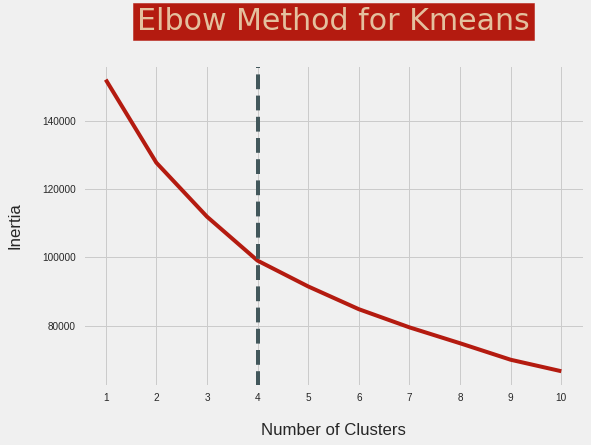

In [ ]:
# Implement elbow_optimizer function for KMeans
elbow_optimizer(inertias, 'Kmeans')

In [ ]:
silhouette_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    score = silhouette_score(df2, kmeans.labels_)
    silhouette_coef.append(score)

calinski_harabasz_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    score = calinski_harabasz_score(df2, kmeans.labels_)
    calinski_harabasz_coef.append(score)

In [ ]:
def plot_evaluation(sh_score, ch_score, name, x=range(2,11)):
    """
    for draw evaluation plot include silhouette_score and calinski_harabasz_score.
        sh_score(list): include silhouette_score of models
        ch_score(list): include calinski_harabasz_score of models
        name(string): name of clustering algorithm
        x(list): has range of number for x axis
    """

    fig, ax = plt.subplots(1,2,figsize=(15,7), dpi=100)
    ax[0].plot(x, sh_score, color=dark_colors[0], marker='o', ms=9, mfc=dark_colors[-1])
    ax[1].plot(x, ch_score, color=dark_colors[0], marker='o', ms=9, mfc=dark_colors[-1])
    ax[0].set_xlabel("Number of Clusters", labelpad=20)
    ax[0].set_ylabel("Silhouette Coefficient", labelpad=20)
    ax[1].set_xlabel("Number of Clusters", labelpad=20)
    ax[1].set_ylabel("calinski Harabasz Coefficient", labelpad=20)
    plt.suptitle(f'Evaluate {name} Clustering',y=0.9, **FONT)
    plt.tight_layout(pad=3)
    plt.show()


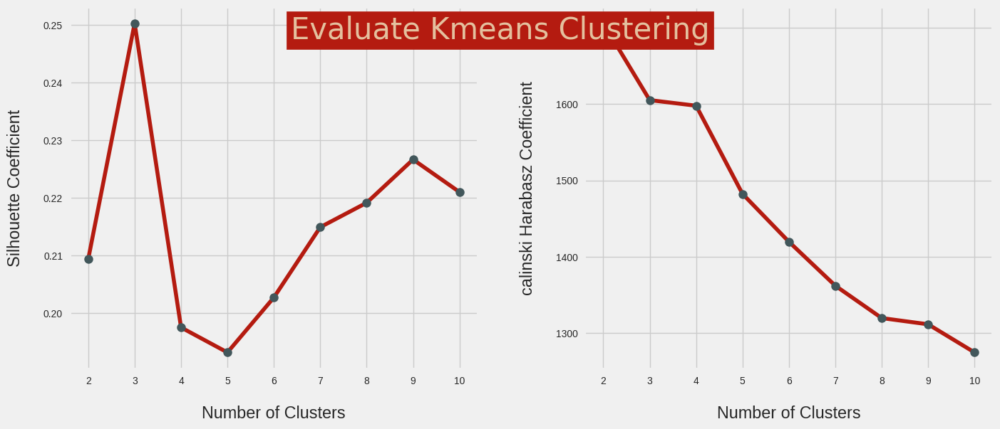

In [ ]:
# Draw plots of silhouette_score and calinski_harabasz_score for kmeans models
# To check the correctness of the result obtained from the elbow method
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'Kmeans')

In [ ]:
# Create dict to store results of clustering algorithms for comparision
best_model = pd.DataFrame({'Model':[], 'Sil_score':[], 'CH_score':[], 'setting':[]})

In [ ]:
# Implement kmeans for n_clusters=3
kmeans = KMeans(n_clusters=3, **kmeans_set).fit(df2)
# Store result of kmeans
pred = kmeans.labels_
# Store the coordinates of centroids
centroids = kmeans.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [df2.columns])
centroids.T

,0,1,2
balance,0.303944,-0.367227,1.166323
balance_frequency,0.439589,-0.179740,0.342575
purchases,1.511614,-0.234509,-0.289383
oneoff_purchases,1.268264,-0.206109,-0.207014
installments_purchases,1.243736,-0.175729,-0.303986
cash_advance,-0.249556,-0.308897,1.377638
purchases_frequency,1.141921,-0.066657,-0.641343
oneoff_purchases_frequency,1.564646,-0.240889,-0.306603
purchases_installments_frequency,0.943199,-0.049147,-0.552346
cash_advance_frequency,-0.361336,-0.333864,1.560896


In [ ]:
# Store resluts of kmeans
best_model.loc[len(best_model.index)] = [
    f"Kmeans",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"n_clusters":3, **kmeans_set}]

In [ ]:
# Transmition slaced centroids to real
real_centroids = scaler.inverse_transform(centroids)
real_centroids = pd.DataFrame(data=real_centroids, columns = [df2.columns])
real_centroids.T

,0,1,2
balance,2197.296209,800.275491,3992.310601
balance_frequency,0.981438,0.834790,0.958467
purchases,4233.043267,502.262838,385.018966
oneoff_purchases,2697.663874,250.387735,248.886107
installments_purchases,1535.858626,252.196794,136.210395
cash_advance,455.603491,331.157545,3868.069401
purchases_frequency,0.948701,0.463653,0.233011
oneoff_purchases_frequency,0.669259,0.130616,0.111012
purchases_installments_frequency,0.739333,0.344946,0.144960
cash_advance_frequency,0.062830,0.068327,0.447509


In [ ]:
# Adding the clusters column to the main dataframe (df2) and store in new dataframe
df_result_kmeans = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_kmeans

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,1
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,1
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,1
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,1


In [ ]:
# Overview of resluts
def check_result(data):
    """Check results obtained from each algorithm and number of clusters
        data(Dataframe): orgindal dataset + cluster column obtained from algorithm
    """

    fig, axes = plt.subplots(1,2,figsize=(10,4))
    # Count of cluster (countplot)
    sns.countplot(data=data, x='cluster', ax=axes[0], palette=dark_colors[0:int(data.cluster.nunique())], saturation=1, edgecolor = "#1c1c1c", linewidth = 2)
    for container in axes[0].containers:
        axes[0].bar_label(container, label_type="center", padding=5, size=12, color="black", rotation=0,
        bbox={"boxstyle": "round", "pad": 0.4, "facecolor": "#e0b583", "edgecolor": "#1c1c1c", "linewidth" : 2, "alpha": 1})
    # Draw pie plot
    slices = data['cluster'].value_counts().sort_index().values
    activities = [var for var in data['cluster'].value_counts().sort_index().index]
    wedges, texts, autotexts = axes[1].pie(
        slices,
        labels=activities,
        shadow=True,
        autopct='%1.1f%%',
        textprops=dict(size=16, color="black"),
        pctdistance = 0.6,
        radius=1,
        colors = dark_colors[0:int(data.cluster.nunique())],
        wedgeprops=dict(edgecolor = "black", linewidth = 2),)

    plt.legend(
        wedges,
        data.cluster.value_counts().sort_index().index,
        title="Clusters",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1),
        edgecolor = "black")


    plt.suptitle(f'Count of Each Cluster', y=1.09, **FONT)
    plt.show()


AttributeError: ignored

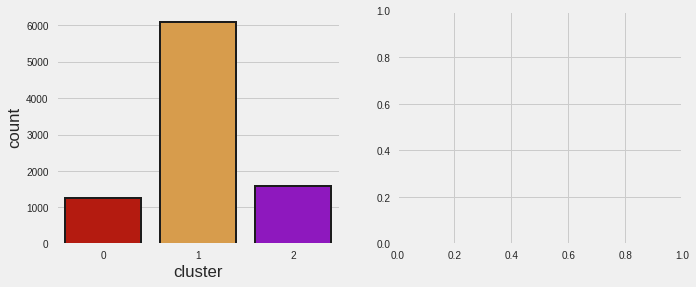

In [ ]:
# Implement check result function for Kmeans
check_result(df_result_kmeans)

In [ ]:
# Using NearestNeighbors fucntion for to guess the right value for eps
knn = NearestNeighbors(n_neighbors = 4)
model = knn.fit(df2)
distances, indices = knn.kneighbors(df2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.grid()
plt.plot(distances);
plt.xlabel('Points Sorted by Distance')
plt.ylabel('7-NN Distance')
plt.title('K-Distance Graph')

In [ ]:
# Finding best value for eps and min_sample
eps_values = np.arange(1,15,2) # eps values to be investigated
min_samples = np.arange(20,41,10) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))

In [ ]:
# Check optimom n_clusters for implement birch by using silhouette and calinski coefficient
silhouette_coef = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = silhouette_score(df2, dbscan.labels_)
    silhouette_coef.append(score)
    # for check number of clusters
    num_of_clusters.append(len(np.unique(dbscan.labels_)))

calinski_harabasz_coef = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = calinski_harabasz_score(df2, dbscan.labels_)
    calinski_harabasz_coef.append(score)

In [ ]:
# Check cluster results by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])
tmp['No_of_clusters'] = num_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

In [ ]:
# Check silhouette score by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])
tmp['Sil_score'] = silhouette_coef

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

In [ ]:
# Check Calinski score by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])
tmp['CH_score'] = calinski_harabasz_coef

pivot_1 = pd.pivot_table(tmp, values='CH_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

In [ ]:
# Draw plots of silhouette_score and calinski_harabasz_score for DBSCAN model
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'DBSCAN', x=range(len(DBSCAN_params)))

In [ ]:
# Coordinates of point in above table
for i in enumerate(DBSCAN_params):
    print(i)

In [ ]:
# Find best eps and min_samples value
eps_values = np.arange(3,5,0.25) # eps values to be investigated
min_samples = np.arange(20,41,10) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))

In [ ]:
# Check optimom n_clusters for implement birch by using silhouette and calinski coefficient
silhouette_coef = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = silhouette_score(df2, dbscan.labels_)
    silhouette_coef.append(score)
    # for check number of clusters
    num_of_clusters.append(len(np.unique(dbscan.labels_)))

calinski_harabasz_coef = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = calinski_harabasz_score(df2, dbscan.labels_)
    calinski_harabasz_coef.append(score)

In [ ]:
# Draw plots of silhouette_score and calinski_harabasz_score for DBSCAN model
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'DBSCAN', x=range(len(DBSCAN_params)))

In [ ]:
# Coordinates of point in above table
for i in enumerate(DBSCAN_params):
    print(i)

In [ ]:
# Implement DBSCAN for best eps and min_sample obtained from above
dbscan = DBSCAN(eps=3.5, min_samples=40)
dbscan.fit(df2)
# Store result of DBSCAN
pred = dbscan.labels_
# Number of cluster
num_of_clusters = len(np.unique(pred))
# Evaluate results of mean shift by silhouette and calinski coefficient
sh_score = silhouette_score(df2, pred)
ch_score = calinski_harabasz_score(df2, pred)
# Print results
print(colored(f"Number of cluster: {np.unique(pred)}",'red'))
print(colored(f"Silhouette Coefficient: {sh_score:.2f}", 'red'))
print(colored(f"Calinski Harabasz Coefficient: {ch_score:.2f}", 'red'))

In [ ]:
# Store results obtained from DBSCAN
best_model.loc[len(best_model.index)] = [
    f"DBSCAN",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"eps":3.5, "min_samples":40}]

In [ ]:
# Adding the clusters column to the main dataframe (df2) and store in new dataframe
df_result_dbscan = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_dbscan

In [ ]:
# Implement check_result function for DBSCAN model
check_result(df_result_dbscan)

In [ ]:
# Draw dondrogram for Agglomerative clustering
def dendoOptimizer(data):
    """Plots a Dendogram Plot on the data provided"""
    sch.dendrogram(sch.linkage(data, method='ward'))
    plt.title('Dendrogram')
    plt.xlabel('Customers')
    plt.ylabel('Euclidean distances')
    plt.show()

In [ ]:
# Implement dendoOptimizer
dendoOptimizer(df2)

In [ ]:
# Find optimom bandwidth for implement agglomerative clustering by using silhouette and calinski coefficient
silhouette_coef = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(df2)
    score = silhouette_score(df2, agg.fit_predict(df2))
    silhouette_coef.append(score)

calinski_harabasz_coef = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(df2)
    score = calinski_harabasz_score(df2, agg.fit_predict(df2))
    calinski_harabasz_coef.append(score)

In [ ]:
# Draw plots of silhouette_score and calinski_harabasz_score for AgglomerativeClustering models
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'Agglomerative', x=range(2,15))

In [ ]:
# Implement AgglomerativeClustering by n_clusters=2
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(df2)
# Store result of Agglomerative
pred = agg.labels_
# Evaluate results of mean shift by silhouette and calinski coefficient
sh_score = silhouette_score(df2, pred)
ch_score = calinski_harabasz_score(df2, pred)
# Print results
print(colored(f"Silhouette Coefficient: {sh_score:.2f}", 'red'))
print(colored(f"Calinski Harabasz Coefficient: {ch_score:.2f}", 'red'))
# Adding the clusters column to the main dataframe (df2) and store in new dataframe
df_result_agg = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_agg

In [ ]:
# Store results obtained from AgglomerativeClustering
best_model.loc[len(best_model.index)] = [
    f"Agglomerative",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"n_clusters":2}]

In [ ]:
# Implement check_result function for AgglomerativeClustering model
check_result(df_result_agg)